<a href="https://colab.research.google.com/github/BrodyVogel/ANLY-590-Deep-Learning/blob/master/DeepLearningProject.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Deep Learning Project: Aerial Image Classification

## Data Processing: Train Test Split

In [1]:
from google.colab import drive
! ls

gdrive	sample_data


In [2]:
# connect to Google drive
drive.mount('/content/gdrive/')

Drive already mounted at /content/gdrive/; to attempt to forcibly remount, call drive.mount("/content/gdrive/", force_remount=True).


In [3]:
!ls gdrive/'My Drive'/DeepLearningProj

UCMerced_LandUse


In [4]:
# move to data directory, data source: http://weegee.vision.ucmerced.edu/datasets/landuse.html
% cd gdrive/'My Drive'/DeepLearningProj/UCMerced_LandUse

/content/gdrive/My Drive/DeepLearningProj/UCMerced_LandUse


In [0]:
# import libraries
import os
import shutil
import random as rand

In [6]:
# list files
os.listdir()

#! rm -r Train
#! rm -r Test

['Images',
 '.DS_Store',
 'readme.txt',
 'readme.txt.bak',
 'TrainSet',
 'TestSet',
 'VGGTransferLearning2.h5',
 'CNNmod3.h5',
 'plz.png']

In [7]:
# look at number of labels and images for each
imgsource = "./Images"
labels = os.listdir(imgsource)
labels = labels[0:(len(labels)-1)]
num_classes = len(labels)
num_imgs = [len(os.listdir(imgsource+'/'+l)) for l in labels]
print(num_classes, ':', num_imgs)

21 : [100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100]


In [8]:
# label names
print(labels)

['buildings', 'forest', 'river', 'golfcourse', 'mobilehomepark', 'harbor', 'runway', 'agricultural', 'chaparral', 'tenniscourt', 'intersection', 'overpass', 'baseballdiamond', 'parkinglot', 'airplane', 'sparseresidential', 'storagetanks', 'mediumresidential', 'freeway', 'beach', 'denseresidential']


In [9]:
# check if train/test split needs to be generated
trainpath = "./TrainSet"
testpath = "./TestSet"
split = input("Generate train/test split? (y/n)\t")
if split.lower()=='y':
  split_into_train_test = True
else:
  split_into_train_test = False

Generate train/test split? (y/n)	n


In [0]:
# ~ 15mins
# generate train/test split if 'y'
if split_into_train_test:
  # delete directories if they already exist
  if 'TrainSet' in os.listdir():
    ! rm -r TrainSet
  if 'TestSet' in os.listdir():
    ! rm -r TestSet
  # generate new folders
  os.makedirs(trainpath)
  os.makedirs(testpath)
  os.listdir()
  # for each label generate new folders
  for fold in labels:
    # randomly shuffle whether to copy image
    split = [True]*20+[False]*80
    rand.shuffle(split)
    img_files = os.listdir(imgsource+'/'+fold)
    os.makedirs(trainpath+'/'+fold)
    os.makedirs(testpath+'/'+fold)
    for f in img_files:
      if split.pop():
        shutil.copyfile(imgsource+'/'+fold+'/'+f, testpath+'/'+fold+'/'+f)
      else:
        shutil.copyfile(imgsource+'/'+fold+'/'+f, trainpath+'/'+fold+'/'+f)

In [10]:
# look at number of labels and images for each train/test set
imgsource = trainpath
num_classes = len(labels)
num_imgs = [len(os.listdir(imgsource+'/'+l)) for l in labels]
print('Training set\t', num_classes, 'classes :', num_imgs)

imgsource = testpath
num_classes = len(labels)
num_imgs = [len(os.listdir(imgsource+'/'+l)) for l in labels]
print('Test set\t', num_classes, 'classes :', num_imgs)

Training set	 21 classes : [80, 80, 80, 80, 80, 80, 80, 80, 80, 80, 80, 80, 80, 80, 80, 80, 80, 80, 80, 80, 80]
Test set	 21 classes : [20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20]


## Image Classification

In [92]:
# import libraries
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter

from keras.applications import VGG16
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from keras.models import Sequential
from keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, Dropout
from keras.optimizers import RMSprop

ImportError: ignored

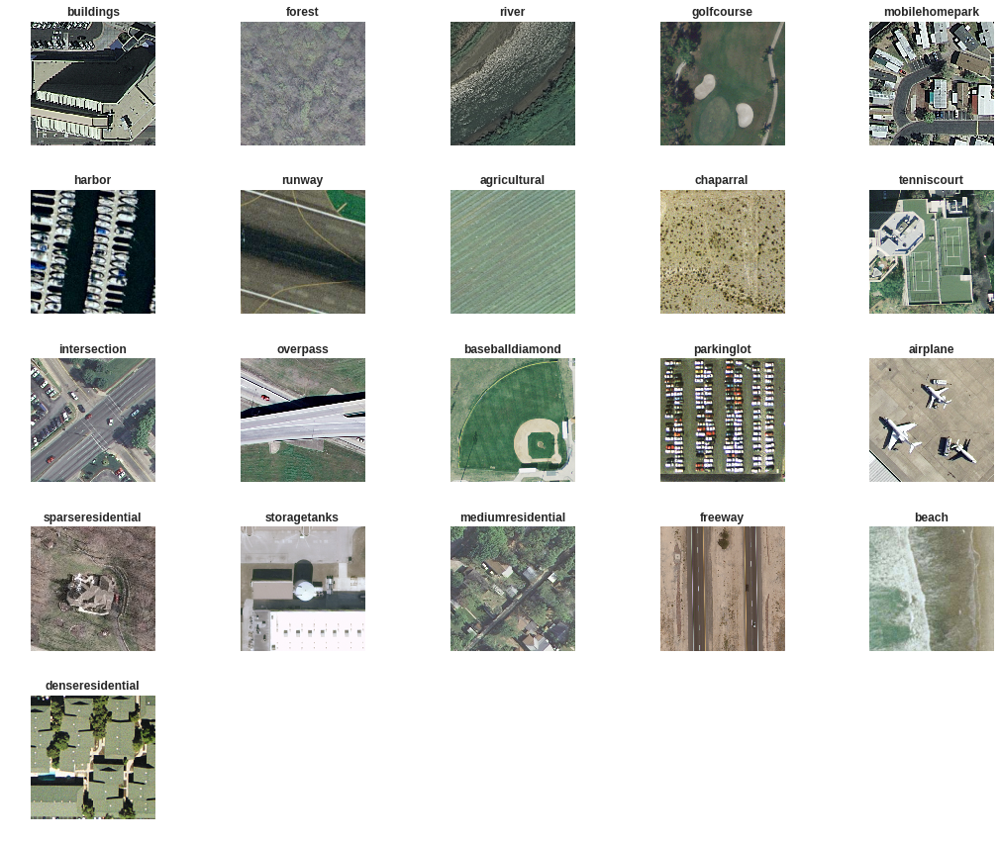

In [26]:
# display an image from training data
plt.figure(figsize=(15, 12))
where = 1
for x in range(len(labels)):
  l = labels[x]
  f = os.listdir('./TrainSet/'+l+'/')
  plt.subplot(5, 5, where)
  plt.grid(False)
  plt.axis("off")
  plt.title(l, fontweight = 'bold')
  plt.imshow(load_img('./TrainSet/'+l+'/'+f[0]))
  where += 1
plt.tight_layout()
plt.show()

### Image Generators

In [13]:
# build image generators for models
path_train_data = "./TrainSet/"
path_test_data = "./TestSet/"

train_datagen = ImageDataGenerator(
        rescale=1./255,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        path_train_data,
        classes = labels,
        target_size=(256, 256),
        batch_size=100,
        class_mode='categorical')

test_generator = test_datagen.flow_from_directory(
        path_test_data,
        classes = labels,
        target_size=(256,256),
        batch_size=50,
        class_mode='categorical')

Found 1680 images belonging to 21 classes.
Found 420 images belonging to 21 classes.


### VGG16 Transfer Learning: Static

In [0]:
# build CNN with transfer learning using VGG16
conv_base = VGG16(weights="imagenet", include_top=False, input_shape=(256, 256, 3))
model1 = Sequential()
model1.add(conv_base)
model1.add(Flatten())
model1.add(Dense(256, activation="relu"))
model1.add(Dense(21, activation="sigmoid"))
model1.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 8, 8, 512)         14714688  
_________________________________________________________________
flatten_1 (Flatten)          (None, 32768)             0         
_________________________________________________________________
dense_1 (Dense)              (None, 256)               8388864   
_________________________________________________________________
dense_2 (Dense)              (None, 21)                5397      
Total params: 23,108,949
Trainable params: 23,108,949
Non-trainable params: 0
_________________________________________________________________


In [0]:
# fix base weights
conv_base.trainable = False
model1.trainable_weights

[<tf.Variable 'dense_1/kernel:0' shape=(32768, 256) dtype=float32_ref>,
 <tf.Variable 'dense_1/bias:0' shape=(256,) dtype=float32_ref>,
 <tf.Variable 'dense_2/kernel:0' shape=(256, 21) dtype=float32_ref>,
 <tf.Variable 'dense_2/bias:0' shape=(21,) dtype=float32_ref>]

In [0]:
# check new number of trainable parameters
model1.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 8, 8, 512)         14714688  
_________________________________________________________________
flatten_1 (Flatten)          (None, 32768)             0         
_________________________________________________________________
dense_1 (Dense)              (None, 256)               8388864   
_________________________________________________________________
dense_2 (Dense)              (None, 21)                5397      
Total params: 23,108,949
Trainable params: 8,394,261
Non-trainable params: 14,714,688
_________________________________________________________________


In [0]:
# compile model
model1.compile(loss="categorical_crossentropy", optimizer=RMSprop(1e-4), metrics=["acc"])

In [0]:
# load model weights
#model.load_weights('VGGTransferLearning.h5')
# or
# train model
# ~15 minutes to run
transfer_learning_mod = model1.fit_generator(train_generator, steps_per_epoch=100, epochs=5, 
                                            validation_data=test_generator, validation_steps=25)
# save weights
model1.save_weights('VGGTransferLearning.h5')

Epoch 1/5
100/100 [==============================] - 236s 2s/step - loss: 0.9238 - acc: 0.7584 - val_loss: 0.4930 - val_acc: 0.8471
Epoch 2/5
100/100 [==============================] - 206s 2s/step - loss: 0.2240 - acc: 0.9448 - val_loss: 0.3734 - val_acc: 0.8741
Epoch 3/5
100/100 [==============================] - 213s 2s/step - loss: 0.0948 - acc: 0.9806 - val_loss: 0.2281 - val_acc: 0.9241
Epoch 4/5
100/100 [==============================] - 212s 2s/step - loss: 0.0526 - acc: 0.9900 - val_loss: 0.2681 - val_acc: 0.9207
Epoch 5/5
100/100 [==============================] - 211s 2s/step - loss: 0.0303 - acc: 0.9941 - val_loss: 0.4457 - val_acc: 0.8655


In [0]:
# function to plot performance
def plotModPerf(mod):
  acc = mod.history['acc']
  val_acc = mod.history['val_acc']
  loss = mod.history['loss']
  val_loss = mod.history['val_loss']

  epochs = range(1, len(acc) + 1)
  plt.figure(figsize=(15, 6))

  plt.subplot(1, 2, 1)
  plt.plot(epochs, loss, label = 'Training loss')
  plt.plot(epochs, val_loss, label = 'Validation loss')
  plt.title('Training and validation loss')
  plt.legend()

  plt.subplot(1, 2, 2)
  plt.plot(epochs, acc, label = 'Training acc')
  plt.plot(epochs, val_acc, label = 'Validation acc')
  plt.title('Training and validation accuracy')
  plt.legend()
  plt.show()

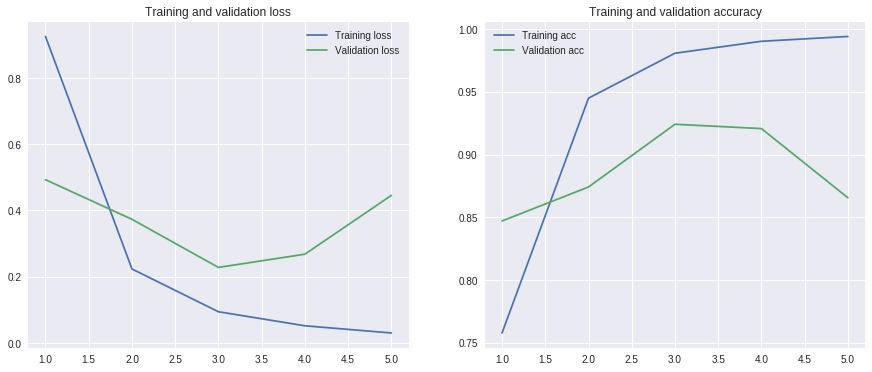

In [0]:
# function to plot performance
plotModPerf(transfer_learning_mod)

In [29]:
# look at labels of the test set
print(test_generator.class_indices)
class_labels = {}
# switch key and values for class labels
for k, v in test_generator.class_indices.items():
  class_labels[str(v)]=k
print(class_labels)

{'buildings': 0, 'forest': 1, 'river': 2, 'golfcourse': 3, 'mobilehomepark': 4, 'harbor': 5, 'runway': 6, 'agricultural': 7, 'chaparral': 8, 'tenniscourt': 9, 'intersection': 10, 'overpass': 11, 'baseballdiamond': 12, 'parkinglot': 13, 'airplane': 14, 'sparseresidential': 15, 'storagetanks': 16, 'mediumresidential': 17, 'freeway': 18, 'beach': 19, 'denseresidential': 20}
{'0': 'buildings', '1': 'forest', '2': 'river', '3': 'golfcourse', '4': 'mobilehomepark', '5': 'harbor', '6': 'runway', '7': 'agricultural', '8': 'chaparral', '9': 'tenniscourt', '10': 'intersection', '11': 'overpass', '12': 'baseballdiamond', '13': 'parkinglot', '14': 'airplane', '15': 'sparseresidential', '16': 'storagetanks', '17': 'mediumresidential', '18': 'freeway', '19': 'beach', '20': 'denseresidential'}


In [0]:
# build functions to look at misclassifications
def display(misclass):
  plt.figure(figsize=(15, 10))

  n = int(np.ceil(np.sqrt(len(misclass))))
  ind = 1
  for y, yhat, x in misclass:
    plt.subplot(n, n, ind)  
    plt.grid(False)
    plt.axis('off')
    plt.text(.5, .5, y+'->\n'+yhat, fontsize=9, color='red')
    plt.imshow(x)
    ind +=1
  plt.show()

def eval_model(model, img_gen):
  
  ind = 1
  
  misclass = []
  
  for i in range(len(img_gen)):
    xs, ys = img_gen.next()
    ys = [class_labels[str(np.argmax(l))]  for l in ys]
    yhats = model.predict(xs)
    yhats = [class_labels[str(np.argmax(p))] for p in yhats]
    
    for y, yhat, x in (list(zip(ys, yhats, xs))):
      if y != yhat:
        misclass.append((y, yhat, x))
  display(misclass)
  misclass = [y+'->'+yhat for y, yhat, x in misclass]
  [print(cnt) for cnt in Counter(misclass).most_common()]

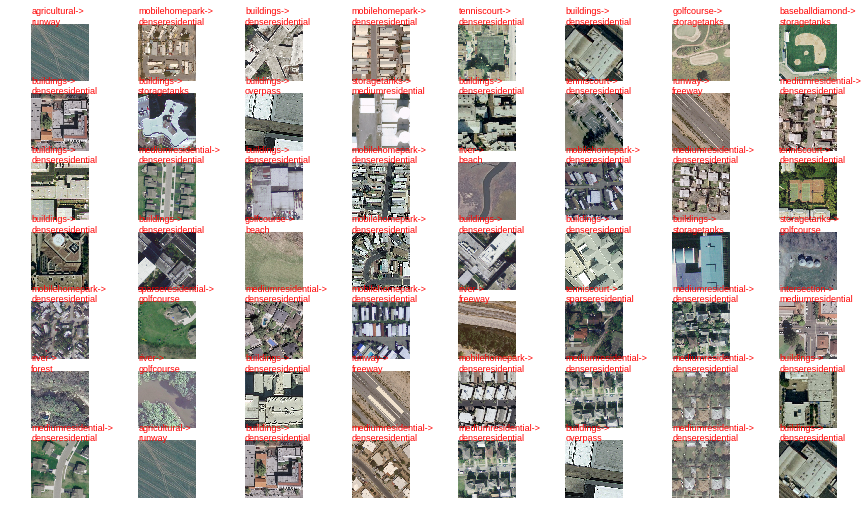

('buildings->denseresidential', 14)
('mediumresidential->denseresidential', 11)
('mobilehomepark->denseresidential', 8)
('tenniscourt->denseresidential', 3)
('agricultural->runway', 2)
('buildings->storagetanks', 2)
('buildings->overpass', 2)
('runway->freeway', 2)
('golfcourse->storagetanks', 1)
('baseballdiamond->storagetanks', 1)
('storagetanks->mediumresidential', 1)
('river->beach', 1)
('golfcourse->beach', 1)
('storagetanks->golfcourse', 1)
('sparseresidential->golfcourse', 1)
('river->freeway', 1)
('tenniscourt->sparseresidential', 1)
('intersection->mediumresidential', 1)
('river->forest', 1)
('river->golfcourse', 1)


In [0]:
# look at misclassifications
eval_model(model1, test_generator)

In [0]:
del model1

### VGG16 Transfer Learning: Non-Static

In [0]:
# build another CNN with transfer learning using VGG16
conv_base = VGG16(weights="imagenet", include_top=False, input_shape=(256, 256, 3))
model2 = Sequential()
model2.add(conv_base)
model2.add(Flatten())
model2.add(Dense(256, activation="relu"))
model2.add(Dense(21, activation="sigmoid"))
model2.summary()

58892288/58889256 [==============================] - 13s 0us/step
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 8, 8, 512)         14714688  
_________________________________________________________________
flatten_1 (Flatten)          (None, 32768)             0         
_________________________________________________________________
dense_1 (Dense)              (None, 256)               8388864   
_________________________________________________________________
dense_2 (Dense)              (None, 21)                5397      
Total params: 23,108,949
Trainable params: 23,108,949
Non-trainable params: 0
_________________________________________________________________


In [0]:
# have static base weights
conv_base.trainable = True
model2.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 8, 8, 512)         14714688  
_________________________________________________________________
flatten_1 (Flatten)          (None, 32768)             0         
_________________________________________________________________
dense_1 (Dense)              (None, 256)               8388864   
_________________________________________________________________
dense_2 (Dense)              (None, 21)                5397      
Total params: 23,108,949
Trainable params: 23,108,949
Non-trainable params: 0
_________________________________________________________________


In [0]:
# compile model
model2.compile(loss="categorical_crossentropy", optimizer=RMSprop(1e-4), metrics=["acc"])

In [0]:
# load model weights
# model2.load_weights('VGGTransferLearning2.h5')
# or
# train model
# ~30 minutes to run
transfer_learning_mod2 = model2.fit_generator(train_generator, steps_per_epoch=100, epochs=7, 
                                            validation_data=test_generator, validation_steps=25)
# save weights
model2.save_weights('VGGTransferLearning2.h5')

Epoch 1/7
100/100 [==============================] - 417s 4s/step - loss: 2.2857 - acc: 0.2885 - val_loss: 1.1322 - val_acc: 0.5371
Epoch 2/7
100/100 [==============================] - 392s 4s/step - loss: 0.8105 - acc: 0.7378 - val_loss: 0.8919 - val_acc: 0.7403
Epoch 3/7
100/100 [==============================] - 391s 4s/step - loss: 0.4103 - acc: 0.8775 - val_loss: 0.3574 - val_acc: 0.8957
Epoch 4/7
100/100 [==============================] - 391s 4s/step - loss: 0.3091 - acc: 0.9233 - val_loss: 0.8877 - val_acc: 0.7974
Epoch 5/7
100/100 [==============================] - 390s 4s/step - loss: 0.2255 - acc: 0.9417 - val_loss: 0.3180 - val_acc: 0.9060
Epoch 6/7
100/100 [==============================] - 390s 4s/step - loss: 0.1626 - acc: 0.9579 - val_loss: 0.3090 - val_acc: 0.9126
Epoch 7/7
100/100 [==============================] - 390s 4s/step - loss: 0.1415 - acc: 0.9680 - val_loss: 0.6296 - val_acc: 0.9121


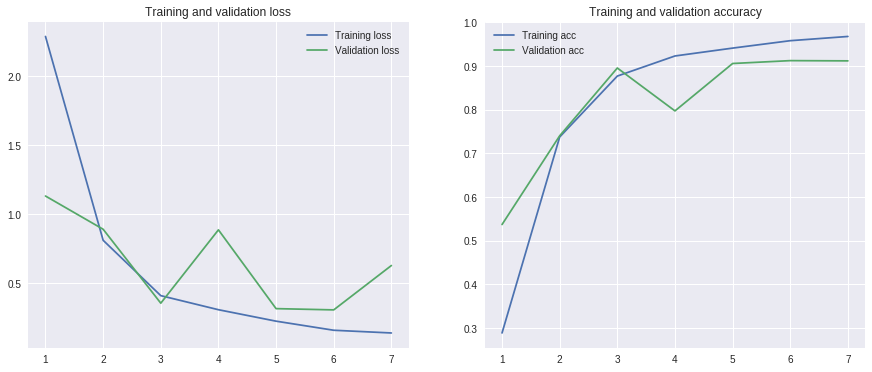

In [0]:
# plot performance
plotModPerf(transfer_learning_mod2)

In [0]:
del model2

### Fully Trained CNN

In [16]:
# build a CNN from scratch without transfer learning
model3 = Sequential()
model3.add(Conv2D(filters = 32, kernel_size=(2, 2), 
                 activation='relu', strides=(1, 1), 
                 padding='valid',
                 input_shape=(256, 256, 3)))
model3.add(Conv2D(filters = 32, kernel_size=(4, 4), 
                 activation='relu', strides=(1, 1), 
                 padding='valid'))
model3.add(MaxPooling2D(pool_size=(5,5)))
model3.add(Dropout(0.25))
model3.add(Flatten())
model3.add(Dense(256, activation='relu'))
model3.add(Dropout(0.5))
model3.add(Dense(21, activation='softmax'))
model3.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 255, 255, 32)      416       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 252, 252, 32)      16416     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 50, 50, 32)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 50, 50, 32)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 80000)             0         
_________________________________________________________________
dense_1 (Dense)              (None, 256)               20480256  
_________________________________________________________________
dropout_2 (Dropout)          (None, 256)               0         
__________

In [0]:
# compile model
model3.compile(loss="categorical_crossentropy", optimizer=RMSprop(1e-4), metrics=["acc"])

In [18]:
# load model weights
# model3.load_weights('CNNmod3.h5')
# or
# ~2 hours to run
training_mod = model3.fit_generator(train_generator, steps_per_epoch=100, epochs=50, 
                                            validation_data=test_generator, validation_steps=25, verbose = 1)
# save weights
#model3.save_weights('CNNmod3.h5')

Epoch 1/50
100/100 [==============================] - 187s 2s/step - loss: 2.8683 - acc: 0.1374 - val_loss: 2.5710 - val_acc: 0.2639
Epoch 2/50
100/100 [==============================] - 181s 2s/step - loss: 2.5624 - acc: 0.2323 - val_loss: 2.4010 - val_acc: 0.3155
Epoch 3/50
100/100 [==============================] - 181s 2s/step - loss: 2.3600 - acc: 0.2948 - val_loss: 2.1417 - val_acc: 0.3810
Epoch 4/50
100/100 [==============================] - 181s 2s/step - loss: 2.2006 - acc: 0.3340 - val_loss: 2.0237 - val_acc: 0.4155
Epoch 5/50
100/100 [==============================] - 182s 2s/step - loss: 2.0439 - acc: 0.3814 - val_loss: 1.8850 - val_acc: 0.4563
Epoch 6/50
100/100 [==============================] - 183s 2s/step - loss: 1.9309 - acc: 0.4086 - val_loss: 1.7537 - val_acc: 0.4897
Epoch 7/50
100/100 [==============================] - 183s 2s/step - loss: 1.8044 - acc: 0.4505 - val_loss: 1.7393 - val_acc: 0.4672
Epoch 8/50
100/100 [==============================] - 183s 2s/step - 

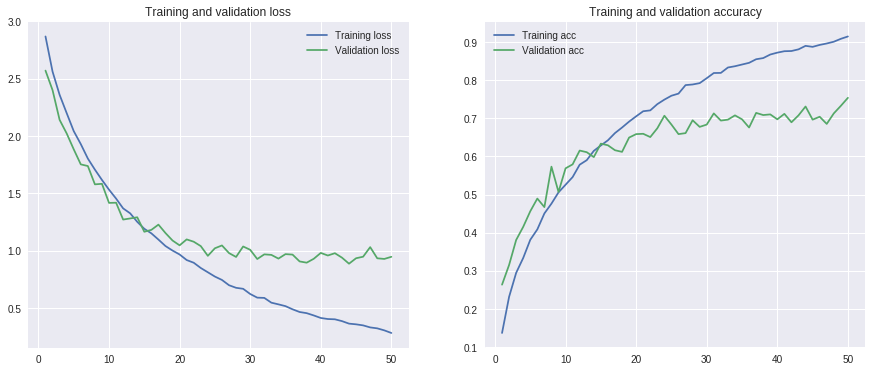

In [27]:
# plot performance
plotModPerf(training_mod)

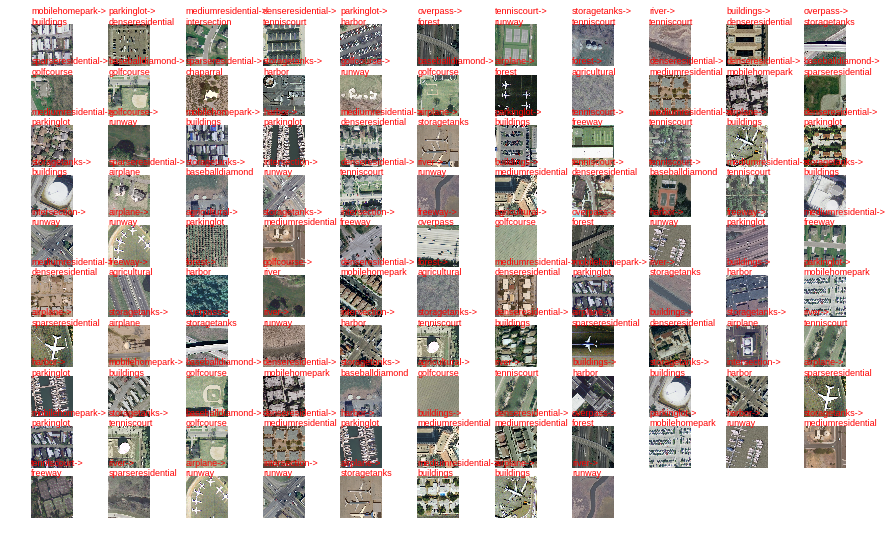

('baseballdiamond->golfcourse', 4)
('mobilehomepark->buildings', 3)
('overpass->forest', 3)
('storagetanks->tenniscourt', 3)
('river->tenniscourt', 3)
('denseresidential->mediumresidential', 3)
('denseresidential->mobilehomepark', 3)
('harbor->parkinglot', 3)
('mediumresidential->denseresidential', 3)
('storagetanks->buildings', 3)
('intersection->runway', 3)
('river->runway', 3)
('airplane->sparseresidential', 3)
('denseresidential->tenniscourt', 2)
('buildings->denseresidential', 2)
('overpass->storagetanks', 2)
('golfcourse->runway', 2)
('forest->agricultural', 2)
('airplane->storagetanks', 2)
('tenniscourt->freeway', 2)
('mediumresidential->tenniscourt', 2)
('airplane->buildings', 2)
('storagetanks->baseballdiamond', 2)
('buildings->mediumresidential', 2)
('airplane->runway', 2)
('storagetanks->mediumresidential', 2)
('agricultural->golfcourse', 2)
('harbor->runway', 2)
('mobilehomepark->parkinglot', 2)
('buildings->harbor', 2)
('parkinglot->mobilehomepark', 2)
('storagetanks->airp

In [30]:
# look at misclassifications
eval_model(model3, test_generator)

In [0]:
from keras import models
# this is to understand what the layers are looking for
def get_activations(image, model):
  # understand what each layer outputs
  layer_outputs = [layer.output for layer in model.layers]
  # get the activation outputs for each of the layers and return them
  activations = models.Model(inputs=model.input, outputs=layer_outputs).predict(image)
  return activations

In [0]:
from PIL import Image

l = labels[0]
f = os.listdir('./TrainSet/'+l+'/')
img_path = './TrainSet/'+l+'/'+f[0]
img = Image.open(img_path).convert('RGB')
imagearray = np.asarray(img)

# here are those activations     "expand_dims" so the model gets the four dimensions it's expecting
activations = get_activations(np.expand_dims(imagearray[:, :, :], axis = 0) , model3)

In [0]:
# activations for the convolutional layers and the pooling layer
first_layer = activations[0]
second_layer = activations[1]
pooling_layer = activations[2]

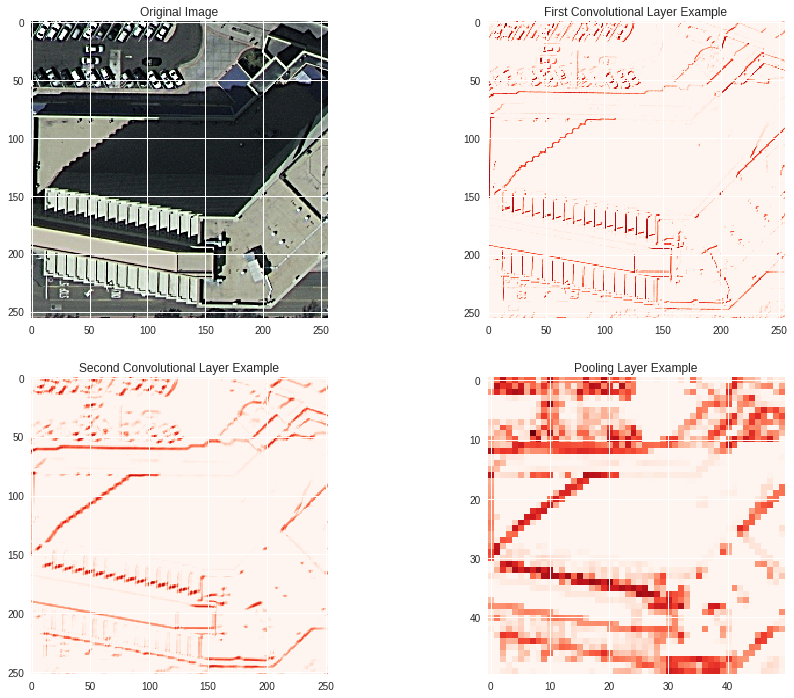

In [39]:
# plot the image and then an example of a kernel in each layer is looking for
plt.figure(figsize = (15, 12))
plt.subplot(2, 2, 1)
plt.title('Original Image')
plt.imshow(imagearray)
plt.subplot(2, 2, 2)
plt.title('First Convolutional Layer Example')
plt.imshow(first_layer[0,:,:,0], cmap = 'Reds')
plt.subplot(2, 2, 3)
plt.title('Second Convolutional Layer Example')
plt.imshow(second_layer[0,:,:,0], cmap = 'Reds')
plt.subplot(2, 2, 4)
plt.title('Pooling Layer Example')
plt.imshow(pooling_layer[0,:,:,0], cmap = 'Reds')

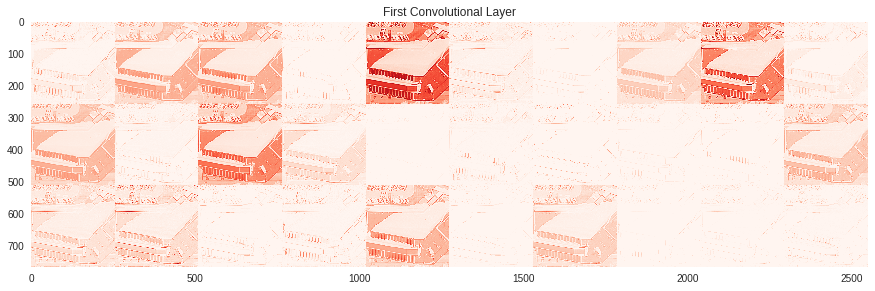

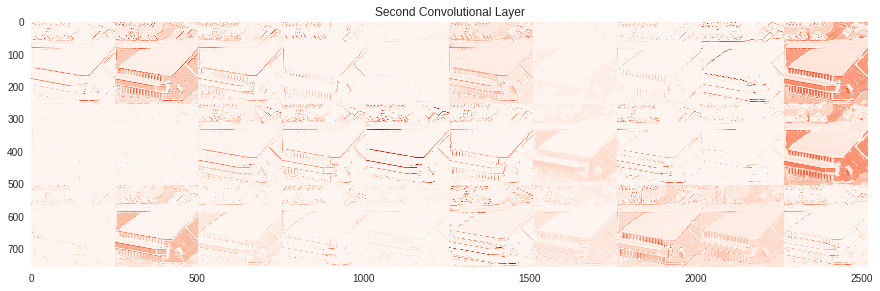

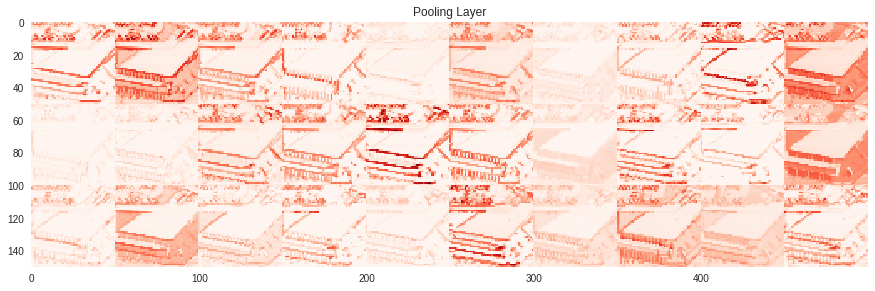

In [0]:
# look at the activation for every kernel
  # took most of this from Keegan's notebook
layer_names = ["First Convolutional Layer", "Second Convolutional Layer", "Pooling Layer"]
    
images_per_row = 10

for layer_name, layer_activation in zip(layer_names, activations): # Displays the feature maps
    n_features = layer_activation.shape[-1] # Number of features in the feature map
    size = layer_activation.shape[1] #The feature map has shape (1, size, size, n_features).
    n_cols = n_features // images_per_row # Tiles the activation channels in this matrix
    display_grid = np.zeros((size * n_cols, images_per_row * size))
    for col in range(n_cols): # Tiles each filter into a big horizontal grid
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            display_grid[col * size : (col + 1) * size, # Displays the grid
                         row * size : (row + 1) * size] = channel_image
    scale = 1.5 / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap = 'Reds')
    
# you can see that almost half the kernels go dead


In [0]:
# build collections of images that the model both gets correct and misses
  # initiate all the lists
images_we_got_right = []
labels_we_have_right = []
images_we_got_wrong = []
labels_we_have_wrong = []
# hoping to get one right and one wrong for every label
  # doesn't work - our model misses some classes 100% of the time
for l in labels:
  # get the image path
  f = os.listdir('./TrainSet/'+l+'/')
  for z in range(20):
    img_path = './TrainSet/'+l+'/'+f[z]
    # open and convert the images
    img = Image.open(img_path).convert('RGB')
    imagearray = np.asarray(img)
    # the images aren't consistently sized - this takes care of that
    to_fill = np.zeros((256, 256, 3))
    to_fill[:imagearray.shape[0],:imagearray.shape[1], :imagearray.shape[2]] = imagearray
    # get the predicted probability and label
    y_class_pred = np.argmax(model3.predict(np.expand_dims(to_fill, axis = 0)))
    predicted_label = labels[y_class_pred]
    # add the image to the list if it meets one of our criteria
    if predicted_label == l and l not in labels_we_have_right:
      images_we_got_right.append((to_fill, l, predicted_label))
      labels_we_have_right.append(l)
    elif l != predicted_label and l not in labels_we_have_wrong:
      images_we_got_wrong.append((to_fill, l, predicted_label))
      labels_we_have_wrong.append(l)
    else:
      continue


In [0]:
#find the parts of images that activate the classification decision of the CNN
  # taken with modificaiton from:
    # https://github.com/jacobgil/keras-cam/blob/master/cam.py
import cv2
from keras.models import *
from keras.callbacks import *
import keras.backend as K

# tells you what each layer outputs
def get_output_layer(model, layer_name):
    # 'layer' is just the name of the layer in the summary above
  layer_dict = dict([(layer.name, layer) for layer in model.layers])
  layer = layer_dict[layer_name]
  return layer

# this shows you which parts of the image light up the activation map
def visualize_class_activation_map(original_img, truth, pred):
  # read in the image and size it appropriately
  #original_img = cv2.imread(img_path, 1)

  width, height, _ = original_img.shape
  img = np.expand_dims(original_img[:, :, :], axis = 0)
  # gets the probabilities associated with each class in the output layer
  class_weights = model3.layers[-1].get_weights()[0]
  # gets the output from the final convolutional layer
  final_conv_layer = get_output_layer(model3, "conv2d_2")
  # define a function that maps an input image to the output of the final convolutional layer and the class predictions vector
                          # taking an input image     # and defining what the output should be
  get_output = K.function([model3.layers[0].input], [final_conv_layer.output, model3.layers[-1].output])
  # call the funciton on the input image
  [conv_outputs, predictions] = get_output([img])
  # outputs of the final convolutional layer
  conv_outputs = conv_outputs[0, :, :, :]

  #Create the class activation map.
  cam = np.zeros(dtype = np.float32, shape = conv_outputs.shape[1:3])
  # this just builds the activation associated with each pixel in the image
  for i, w in enumerate(class_weights[0:251, 1]):
    cam += w * conv_outputs[i, :, :]
  # standardize the class activation map
  cam /= np.max(cam)
  cam = cv2.resize(cam, (height, width))
  # produce the heatmap to see which pixels are maximally activating
  heatmap = cv2.applyColorMap(np.uint8(255*cam), cv2.COLORMAP_AUTUMN)
  # turn down the level of the heatmap and overlay on the original image, then show the result
  img = heatmap*.5 + original_img
  # show it
  plt.subplot(1, 2, 1)
  title_string = "Predicted: " + pred + ", Truth: " + truth
  plt.title(title_string)
  plt.grid(False)
  plt.axis("off")
  plt.imshow(img)
  plt.subplot(1, 2, 2)
  plt.grid(False)
  plt.axis("off")
  plt.title('Original, Mutated Image')
  plt.imshow(original_img)



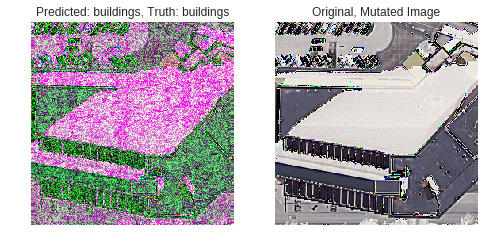

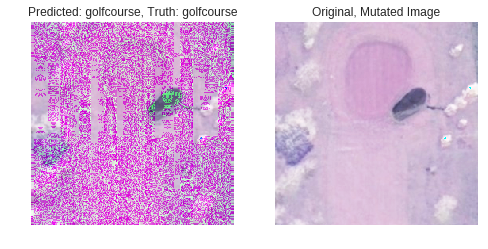

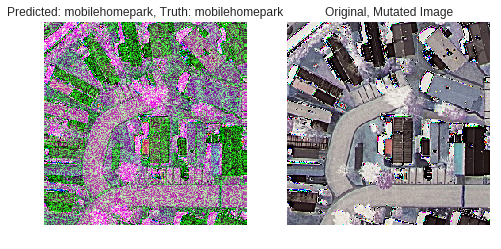

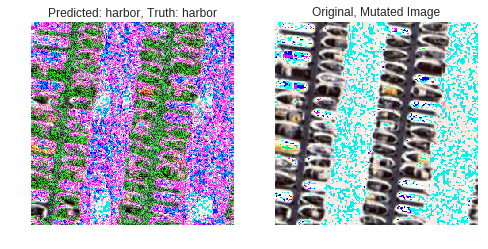

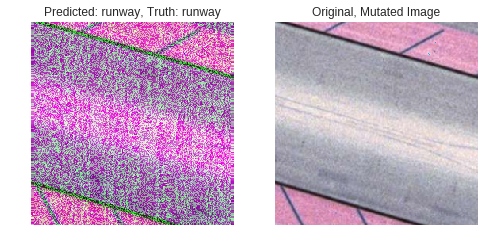

...

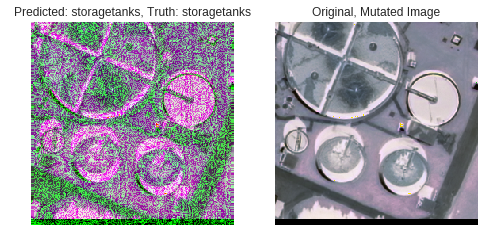

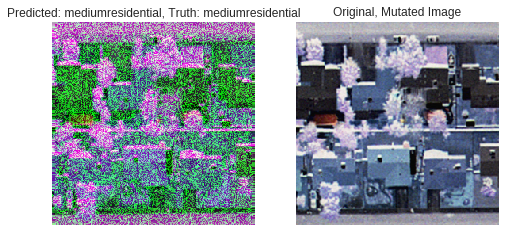

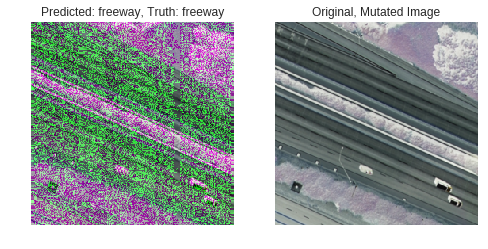

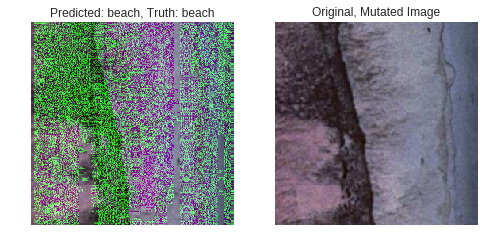

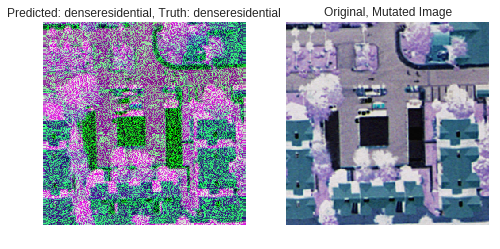

In [89]:
# make a class activation heatmap for images we got right
figsep = 1
for imag in images_we_got_right:
  img, truth, pred = imag
  plt.figure(figsep)
  visualize_class_activation_map(img, truth, pred)
  figsep += 1

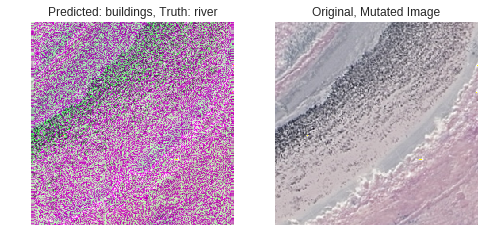

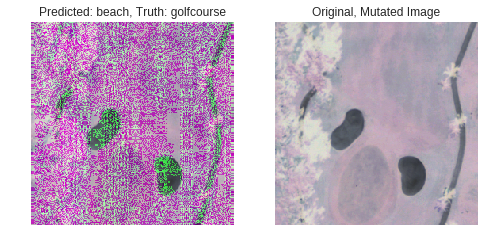

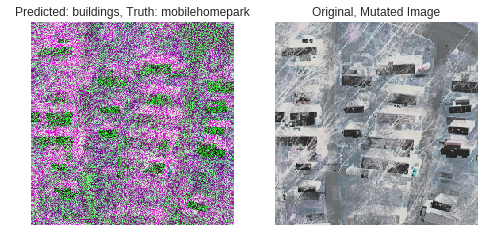

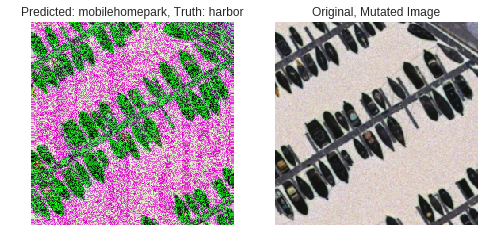

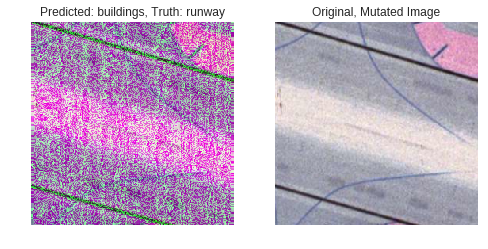

...

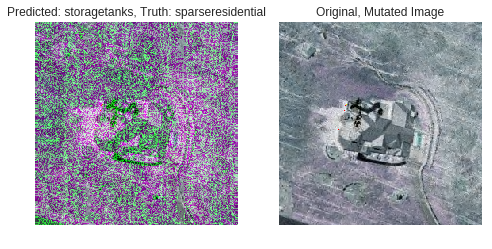

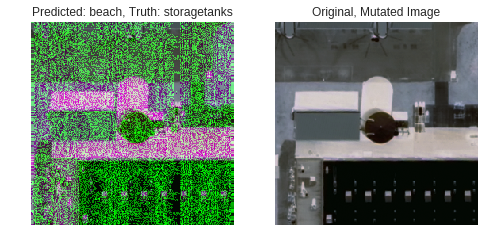

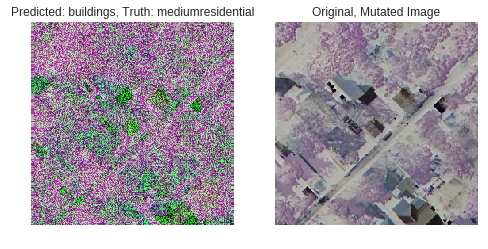

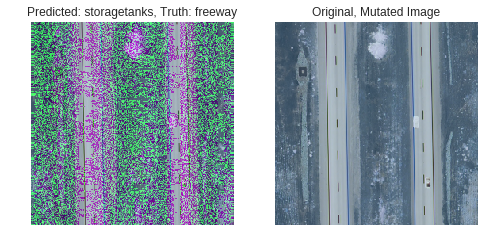

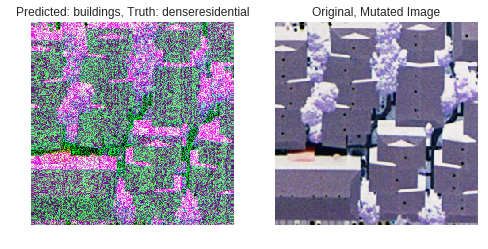

In [90]:
# and one for some images we got wrong
figsep = 1
for imag in images_we_got_wrong[1:]:
  img, truth, pred = imag
  plt.figure(figsep)
  visualize_class_activation_map(img, truth, pred)
  figsep += 1

In [97]:
# fit a model that uses Google's Inception model weights as the base

from keras.applications.inception_v3 import InceptionV3

conv_base = InceptionV3(weights="imagenet", include_top=False, input_shape=(256, 256, 3))
conv_base.trainable = False
I_model = Sequential()
I_model.add(conv_base)
I_model.add(Flatten())
I_model.add(Dense(256, activation="relu"))
I_model.add(Dense(256, activation="relu"))
I_model.add(Dense(21, activation="softmax"))
I_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inception_v3 (Model)         (None, 6, 6, 2048)        21802784  
_________________________________________________________________
flatten_4 (Flatten)          (None, 73728)             0         
_________________________________________________________________
dense_7 (Dense)              (None, 256)               18874624  
_________________________________________________________________
dense_8 (Dense)              (None, 256)               65792     
_________________________________________________________________
dense_9 (Dense)              (None, 21)                5397      
Total params: 40,748,597
Trainable params: 18,945,813
Non-trainable params: 21,802,784
_________________________________________________________________


In [98]:
# compile model
I_model.compile(loss="categorical_crossentropy", optimizer=RMSprop(1e-4), metrics=["acc"])

transfer_learning_I_mod = I_model.fit_generator(train_generator, steps_per_epoch=100, epochs=10, 
                                            validation_data=test_generator, validation_steps=25, verbose = 1)

Epoch 1/10
100/100 [==============================] - 199s 2s/step - loss: 1.3778 - acc: 0.6507 - val_loss: 0.5904 - val_acc: 0.8164
Epoch 2/10
100/100 [==============================] - 184s 2s/step - loss: 0.2925 - acc: 0.9146 - val_loss: 0.5278 - val_acc: 0.8586
Epoch 3/10
100/100 [==============================] - 190s 2s/step - loss: 0.1486 - acc: 0.9616 - val_loss: 0.4477 - val_acc: 0.8639
Epoch 4/10
100/100 [==============================] - 191s 2s/step - loss: 0.0946 - acc: 0.9720 - val_loss: 0.6309 - val_acc: 0.8207
Epoch 5/10
100/100 [==============================] - 191s 2s/step - loss: 0.0646 - acc: 0.9821 - val_loss: 0.7102 - val_acc: 0.8405
Epoch 6/10
100/100 [==============================] - 189s 2s/step - loss: 0.0599 - acc: 0.9852 - val_loss: 0.9567 - val_acc: 0.8000
Epoch 7/10
100/100 [==============================] - 188s 2s/step - loss: 0.0605 - acc: 0.9842 - val_loss: 0.6923 - val_acc: 0.8448
Epoch 8/10
100/100 [==============================] - 193s 2s/step - 

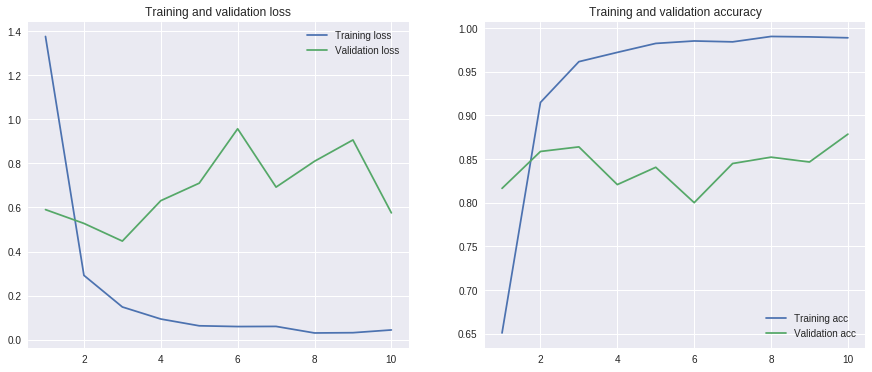

In [99]:
# plot performance
plotModPerf(transfer_learning_I_mod)